In [1]:
%%capture

!pip install pafy youtube-d1 moviepy

In [2]:
!pip install pafy
!pip install youtube_dl


  Using cached pafy-0.5.5-py2.py3-none-any.whl.metadata (10 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 22.4 MB/s eta 0:00:00


In [3]:

import os
import cv2
import pafy
import math
import random
import numpy as np

import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt
from moviepy.editor import *

%matplotlib inline
from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

In [4]:
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [5]:
%%capture#hides the output of cell

!wget --no-check-certificate https://www.crcv.ucf.edu/data/UCF50.rar

!unrar x UCF50.rar

In [6]:
seed_constant = 27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

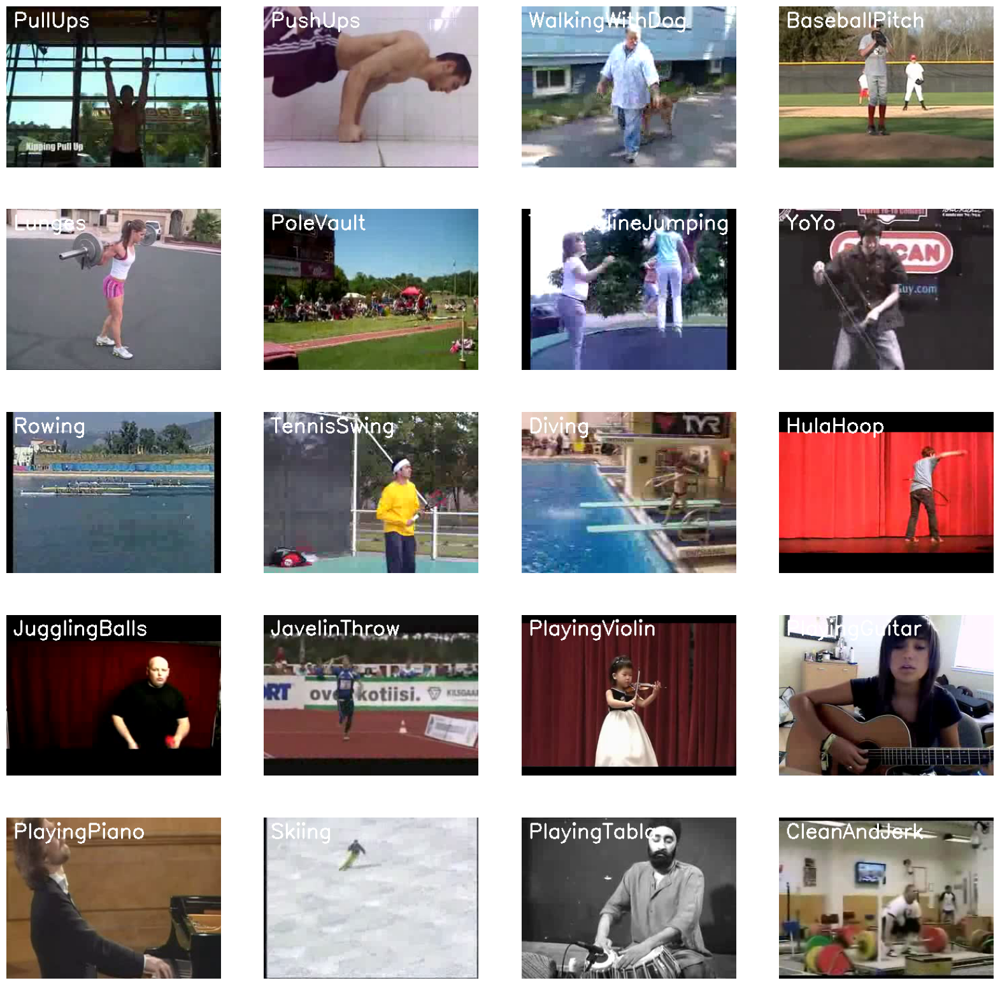

In [7]:
plt.figure(figsize = (20,20))

all_classes_names = os.listdir('UCF50')

random_range = random.sample(range(len(all_classes_names)), 20)

for counter, random_index in enumerate(random_range, 1):
  selected_class_name = all_classes_names[random_index]

  video_files_names_list = os.listdir(f'UCF50/{selected_class_name}')

  selected_video_file_name = random.choice(video_files_names_list)

  video_reader = cv2.VideoCapture(f'UCF50/{selected_class_name}/{selected_video_file_name}')

  _, bgr_frame = video_reader.read()

  video_reader.release()

  rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

  cv2.putText(rgb_frame, selected_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

  plt.subplot(5, 4, counter);plt.imshow(rgb_frame);plt.axis('off')

In [8]:
  IMAGE_HEIGHT, IMAGE_WIDTH = 64, 64

  SEQUENCE_LENGTH = 20

  DATASET_DIR = "UCF50"

  CLASSES_LIST = ["WalkingWithDog", "TaiChi", "Swing", "HorseRace"]

In [9]:
def frames_extraction(video_path):
  frames_list = []
  video_reader = cv2.VideoCapture(video_path)

  video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

  skip_frames_window = max(int(video_frames_count/SEQUENCE_LENGTH), 1)

  for frame_counter in range(SEQUENCE_LENGTH):
    video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

    success, frame = video_reader.read()

    if not success:
      break

    resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

    normalized_frame = resized_frame / 255

    frames_list.append(normalized_frame)

  video_reader.release()

  return frames_list

In [10]:
import os
import numpy as np

def create_dataset(CLASSES_LIST, DATASET_DIR, SEQUENCE_LENGTH):
    features = []
    labels = []
    video_files_paths = []

    for class_index, class_name in enumerate(CLASSES_LIST):
        print(f'Extracting Data of Class: {class_name}')

        try:
            files_list = os.listdir(os.path.join(DATASET_DIR, class_name))
        except FileNotFoundError:
            print(f"Directory not found for class: {class_name}. Skipping...")
            continue

        for file_name in files_list:
            video_file_path = os.path.join(DATASET_DIR, class_name, file_name)

            try:
                frames = frames_extraction(video_file_path)
            except Exception as e:
                print(f"Error processing {video_file_path}: {e}")
                continue

            if len(frames) == SEQUENCE_LENGTH:
                features.append(frames)
                labels.append(class_index)
                video_files_paths.append(video_file_path)
            else:
                print(f"Skipping {video_file_path}: Not enough frames ({len(frames)})")

    features = np.asarray(features)
    labels = np.array(labels)

    return features, labels, video_files_paths

# Example usage:
CLASSES_LIST = ["Walking", "WalkingWithDog", "TaiChi", "Swing", "HorseRace"]
DATASET_DIR = "UCF50"
SEQUENCE_LENGTH = 20

features, labels, video_files_paths = create_dataset(CLASSES_LIST, DATASET_DIR, SEQUENCE_LENGTH)


Extracting Data of Class: Walking
Directory not found for class: Walking. Skipping...
Extracting Data of Class: WalkingWithDog
Extracting Data of Class: TaiChi
Extracting Data of Class: Swing
Extracting Data of Class: HorseRace


In [11]:
one_hot_encoded_labels = to_categorical(labels)

In [12]:
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels,
                                                                            test_size = 0.3, shuffle = True,
                                                                            random_state = seed_constant)

In [13]:
def create_convlstm_model():
    model = Sequential()

    model.add(ConvLSTM2D(filters=8, kernel_size=(3, 3), activation='leaky_relu',
                         data_format="channels_last", recurrent_dropout=0.5,
                         return_sequences=True, input_shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)
                         ))

    model.add(MaxPooling3D(pool_size = (1, 2, 2), padding = 'same', data_format = 'channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters=16, kernel_size=(3, 3), activation='leaky_relu',
                        data_format="channels_last", recurrent_dropout=0.5,
                        return_sequences=True))

    model.add(MaxPooling3D(pool_size = (1, 2, 2), padding = 'same', data_format = 'channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(ConvLSTM2D(filters=32, kernel_size=(3, 3), activation='leaky_relu',
                     data_format="channels_last", recurrent_dropout=0.3,
                     return_sequences=True, kernel_regularizer=regularizers.l2(0.001)))
    model.add(BatchNormalization())
    model.add(MaxPooling3D(pool_size=(1, 2, 2), padding='same', data_format='channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))


    model.add(ConvLSTM2D(filters=64, kernel_size=(3, 3), activation='leaky_relu',
                        data_format="channels_last", recurrent_dropout=0.5,
                        return_sequences=True, kernel_regularizer=regularizers.l2(0.01)))

    model.add(MaxPooling3D(pool_size = (1, 2, 2), padding = 'same', data_format = 'channels_last'))
    model.add(TimeDistributed(Dropout(0.2)))

    model.add(Flatten())
    model.add(Dense(len(CLASSES_LIST), activation = "softmax"))

    model.summary()
    return model

In [14]:
convlstm_model = create_convlstm_model()

print("Model created Successfullly")

  super().__init__(**kwargs)



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv_lstm2d (ConvLSTM2D)             │ (None, 20, 62, 62, 8)       │           3,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d (MaxPooling3D)         │ (None, 20, 31, 31, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 20, 31, 31, 8)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_1 (ConvLSTM2D)           │ (None, 20, 29, 29, 16)      │          13,888 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_1 (MaxPooling3D)       │ (None, 20, 15, 15, 16)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_1 (TimeDistributed) │ (None, 20, 15, 15, 16)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_2 (ConvLSTM2D)           │ (None, 20, 13, 13, 32)      │          55,424 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 20, 13, 13, 32)      │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_2 (MaxPooling3D)       │ (None, 20, 7, 7, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_2 (TimeDistributed) │ (None, 20, 7, 7, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_lstm2d_3 (ConvLSTM2D)           │ (None, 20, 5, 5, 64)        │         221,440 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling3d_3 (MaxPooling3D)       │ (None, 20, 3, 3, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_3 (TimeDistributed) │ (None, 20, 3, 3, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 11520)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 5)                   │          57,605 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 351,685 (1.34 MB)

 Trainable params: 351,621 (1.34 MB)

 Non-trainable params: 64 (256.00 B)

Model created Successfullly


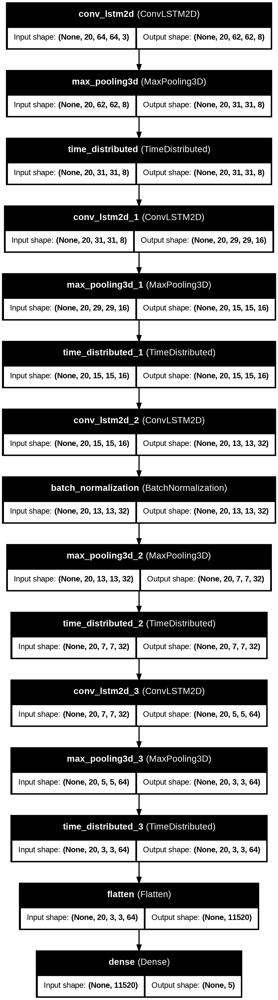

In [15]:
plot_model(convlstm_model, to_file = 'convlstm_model_structure_plot.png', show_shapes = True, show_layer_names= True)

In [16]:
np.random.seed(42)
tf.random.set_seed(42)

In [17]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [18]:
# Define the augmentation strategy
frame_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Augment each frame in the sequences manually
augmented_features_train = []
for sequence in features_train:
    augmented_sequence = []
    for frame in sequence:
        frame = np.expand_dims(frame, 0)  # Add batch dimension (1, height, width, channels)
        augmented_frame = frame_datagen.flow(frame, batch_size=1)[0]  # Augment frame
        augmented_sequence.append(augmented_frame[0])  # Remove batch dimension
    augmented_features_train.append(np.array(augmented_sequence))

augmented_features_train = np.array(augmented_features_train)

In [19]:
# Define fixed learning rate
fixed_learning_rate = 0.01

# Compile the model
convlstm_model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=fixed_learning_rate),
    metrics=["accuracy"]
)

# Create a learning rate scheduler
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)

# Train the model with the learning rate scheduler
history = convlstm_model.fit(
    augmented_features_train, labels_train,
    batch_size=32,
    epochs=50,
    validation_data=(features_test, labels_test),
    callbacks=[lr_scheduler]  # Use learning rate scheduler
)

print("Model training completed successfully")


Epoch 1/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 144s 7s/step - accuracy: 0.2149 - loss: 150.4933 - val_accuracy: 0.3061 - val_loss: 3.1143 - learning_rate: 0.0100
Epoch 2/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 13s 277ms/step - accuracy: 0.2654 - loss: 5.2228 - val_accuracy: 0.3061 - val_loss: 3.9468 - learning_rate: 0.0100
Epoch 3/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 237ms/step - accuracy: 0.2507 - loss: 5.8713 - val_accuracy: 0.3061 - val_loss: 4.6985 - learning_rate: 0.0100
Epoch 4/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step - accuracy: 0.3142 - loss: 4.2736
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.004999999888241291.
11/11 ━━━━━━━━━━━━━━━━━━━━ 5s 240ms/step - accuracy: 0.3150 - loss: 4.2641 - val_accuracy: 0.3061 - val_loss: 4.8116 - learning_rate: 0.0100
Epoch 5/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 5s 243ms/step - accuracy: 0.4296 - loss: 3.9445 - val_accuracy: 0.3061 - val_loss: 4.7083 - learning_rate: 0.0050
Epoch 6/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 237ms/step - accuracy: 0.4279 - loss: 3.6312 - 

In [20]:
import datetime as dt

# Evaluate the convlstm_model
model_evaluation_loss, model_evaluation_accuracy = convlstm_model.evaluate(features_test, labels_test)




5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.4398 - loss: 3.4397


In [21]:
# Define the date-time format
date_time_format = '%Y_%m_%d__%H_%M_%S'

# Get the current date and time
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)

# Define the model file name
model_file_name = f'convlstm_model__Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss:.4f}___Accuracy_{model_evaluation_accuracy:.4f}.h5'

# Save the model
convlstm_model.save(model_file_name)

In [22]:
import matplotlib.pyplot as plt

def plot_metric(model_training_history, metric_name_1, metric_name_2, plot_name):
    """
    This function will plot the metrics passed to it in a graph.

    Args:
    model_training_history: A history object containing a record of training and validation
                            loss values and metrics values at successive epochs.
    metric_name_1: The name of the first metric that needs to be plotted in the graph.
    metric_name_2: The name of the second metric that needs to be plotted in the graph.
    plot_name: The title of the graph.
    """

    # Get metric values using metric names as identifiers.
    metric_value_1 = model_training_history.history[metric_name_1]
    metric_value_2 = model_training_history.history[metric_name_2]

    # Construct a range object which will be used as x-axis (horizontal plane) of the graph.
    epochs = range(len(metric_value_1))

    # Plot the Graph.
    plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
    plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)

    # Add title to the plot.
    plt.title(str(plot_name))

    # Add legend to the plot.
    plt.legend()

    # Display the plot.
    plt.show()

# Example usage:
# plot_metric(model_training_history, 'accuracy', 'val_accuracy', 'Model Accuracy')
# plot_metric(model_training_history, 'loss', 'val_loss', 'Model Loss')


In [24]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import TimeDistributed, Conv2D, MaxPooling2D, Dropout, Flatten, LSTM, Dense

def create_LRCN_model():
    """
    This function will construct the required LRCN model.
    Returns:
    model: It is the required constructed LRCN model.
    """

    # We will use a Sequential model for model construction.
    model = Sequential()

    # Define the Model Architecture.

    model.add(TimeDistributed(Conv2D(16, (3, 3), padding='same', activation='relu'),
                              input_shape=(SEQUENCE_LENGTH, IMAGE_HEIGHT, IMAGE_WIDTH, 3)))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(32, (3, 3), padding='same', activation='relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same', activation='relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Conv2D(64, (3, 3), padding='same', activation='relu')))
    model.add(TimeDistributed(MaxPooling2D((2, 2))))
    model.add(TimeDistributed(Dropout(0.25)))

    model.add(TimeDistributed(Flatten()))

    model.add(LSTM(32))

    model.add(Dense(len(CLASSES_LIST), activation='softmax'))

    # Display the model's summary.
    model.summary()

    # Return the constructed LRCN model.
    return model


In [25]:
LRCN_model = create_LRCN_model()

print("model creatd successfully")

  super().__init__(**kwargs)



Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ time_distributed_4 (TimeDistributed) │ (None, 20, 64, 64, 16)      │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_5 (TimeDistributed) │ (None, 20, 32, 32, 16)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_6 (TimeDistributed) │ (None, 20, 32, 32, 16)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_7 (TimeDistributed) │ (None, 20, 32, 32, 32)      │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_8 (TimeDistributed) │ (None, 20, 16, 16, 32)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_9 (TimeDistributed) │ (None, 20, 16, 16, 32)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_10                  │ (None, 20, 16, 16, 64)      │          18,496 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_11                  │ (None, 20, 8, 8, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_12                  │ (None, 20, 8, 8, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_13                  │ (None, 20, 8, 8, 64)        │          36,928 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_14                  │ (None, 20, 4, 4, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_15                  │ (None, 20, 4, 4, 64)        │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed_16                  │ (None, 20, 1024)            │               0 │
│ (TimeDistributed)                    │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 32)                  │         135,296 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 5)                   │             165 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 195,973 (765.52 KB)

 Trainable params: 195,973 (765.52 KB)

 Non-trainable params: 0 (0.00 B)

model creatd successfully


In [26]:
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = min, restore_best_weights = True)

LRCN_model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])

LRCN_model_training_history = LRCN_model.fit(x = features_train, y = labels_train, epochs = 70, batch_size = 4,
                                             shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])

  early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = min, restore_best_weights = True)



Epoch 1/70
68/68 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - accuracy: 0.2525 - loss: 1.4735 - val_accuracy: 0.2500 - val_loss: 1.3958
Epoch 2/70
68/68 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.3466 - loss: 1.3641 - val_accuracy: 0.3088 - val_loss: 1.3543
Epoch 3/70
68/68 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.4148 - loss: 1.2472 - val_accuracy: 0.4559 - val_loss: 1.3152
Epoch 4/70
68/68 ━━━━━━━━━━━━━━━━━━━━ 5s 55ms/step - accuracy: 0.5219 - loss: 1.1976 - val_accuracy: 0.5294 - val_loss: 1.1766
Epoch 5/70
68/68 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.5865 - loss: 1.0639 - val_accuracy: 0.5588 - val_loss: 1.2104
Epoch 6/70
68/68 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - accuracy: 0.5879 - loss: 0.9824 - val_accuracy: 0.5294 - val_loss: 1.2993
Epoch 7/70
68/68 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.5901 - loss: 0.9953 - val_accuracy: 0.5588 - val_loss: 1.1298
Epoch 8/70
68/68 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step - accuracy: 0.5934 - loss: 0.9787 - val_accuracy: 0.5882 - 

In [27]:
model_evaluation_history = LRCN_model.evaluate(features_test, labels_test)

5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.8765 - loss: 0.4910


In [28]:
# Define the date-time format
date_time_format = '%Y_%m_%d__%H_%M_%S'

# Get the current date and time
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)

# Define the model file name
model_file_name = f'LRCN_model__Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss:.4f}___Accuracy_{model_evaluation_accuracy:.4f}.h5'

# Save the model
LRCN_model.save(model_file_name)

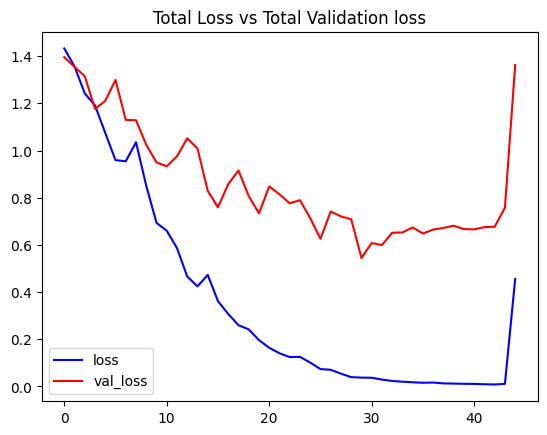

In [29]:
plot_metric(LRCN_model_training_history, 'loss', 'val_loss', 'Total Loss vs Total Validation loss')

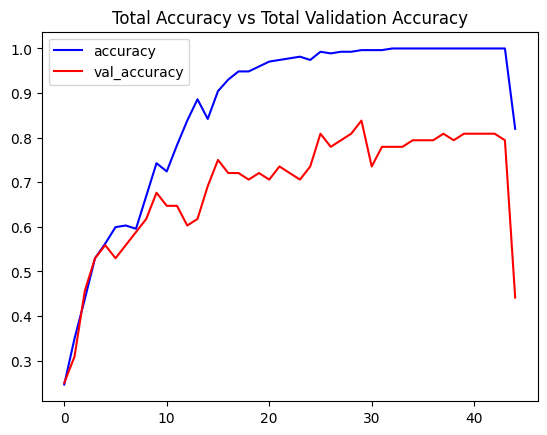

In [30]:
plot_metric(LRCN_model_training_history, 'accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

In [31]:
import pafy

def download_youtube_videos(youtube_video_url, output_directory):
    """
    This function downloads the YouTube video whose URL is passed to it as an argument.
    Args:
    youtube_video_url: URL of the video that is required to be downloaded.
    output_directory: The directory path to which the video needs to be stored after downloading.
    Returns:
    title: The title of the downloaded YouTube video.
    """

    # Create a video object which contains useful information about the video.
    video = pafy.new(youtube_video_url)

    # Retrieve the title of the video.
    title = video.title

    # Get the best available quality object for the video.
    video_best = video.getbest()

    # Construct the output file path.
    output_file_path = f'{output_directory}/{title}.mp4'

    # Download the YouTube video at the best available quality and store it to the constructed path.
    video_best.download(filepath=output_file_path, quiet=True)

    # Return the video title.
    return title


In [32]:
!pip install pytube


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 3.0 MB/s eta 0:00:00


### Download the test video

In [33]:
!pip install --upgrade pytube


In [34]:
from pytube import YouTube
import os

def download_youtube_videos(youtube_video_url, output_directory):
    """
    This function downloads the YouTube video whose URL is passed to it as an argument.
    Args:
    youtube_video_url: URL of the video that is required to be downloaded.
    output_directory: The directory path to which the video needs to be stored after downloading.
    Returns:
    title: The title of the downloaded YouTube video.
    """

    try:
        # Create a YouTube object which contains useful information about the video.
        yt = YouTube(youtube_video_url)

        # Retrieve the title of the video.
        title = yt.title

        # Get the best available quality object for the video.
        video_best = yt.streams.get_highest_resolution()

        # Construct the output file path.
        output_file_path = f'{output_directory}/{title}.mp4'

        # Download the YouTube video at the best available quality and store it to the constructed path.
        video_best.download(output_path=output_directory, filename=f'{title}.mp4')

        # Return the video title.
        return title

    except Exception as e:
        print(f"An error occurred: {e}")
        return None

test_videos_dir = 'test_videos'
os.makedirs(test_videos_dir, exist_ok=True)

video_title = download_youtube_videos('https://www.youtube.com/watch?v=8u0qjmHIOcE', test_videos_dir)

if video_title:
    input_video_file_path = f'{test_videos_dir}/{video_title}.mp4'
    print(f"Video downloaded successfully: {input_video_file_path}")
else:
    print("Failed to download video.")


An error occurred: HTTP Error 400: Bad Request
Failed to download video.


In [40]:
def predict_on_video(video_file_path, output_file_path, SEQUENCE_LENGTH):


  video_reader = cv2.VideoCapture(video_file_path)

  original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
  original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))

  video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'),
                                video_reader.get(cv2.CAP_PROP_FPS), (original_video_width, original_video_height))

  frames_queue = deque(maxlen=SEQUENCE_LENGTH)

  predicted_class_name = ''

  while video_reader.isOpened():

      ok, frame = video_reader.read()

      if not ok:
          break

      resized_frame = cv2.resize(frame, (IMAGE_HEIGHT, IMAGE_WIDTH))

      normalized_frame = resized_frame / 255

      frames_queue.append(normalized_frame)

      if len(frames_queue) == SEQUENCE_LENGTH:

          predicted_labels_probabilities = LRCN_model.predict(np.expand_dims(frames_queue, axis=0))[0]

          predicted_label = np.argmax(predicted_labels_probabilities)
          predicted_class_name = CLASSES_LIST[int(predicted_label)]

      cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

      video_writer.write(frame)

  video_reader.release()
  video_writer.release()


### Perform action recog. from the video

In [41]:
input_video_file_path = '/content/test_videos/Test Video.mp4'

output_video_file_path = f'{test_videos_dir}/{video_title}-Output-SeqLen{SEQUENCE_LENGTH}.mp4'

predict_on_video(input_video_file_path, output_video_file_path, SEQUENCE_LENGTH)

VideoFileClip(output_video_file_path, audio = False, target_resolution=(300, None)).ipython_display()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

t:  99%|█████████▊| 855/867 [00:02<00:00, 390.01it/s, now=None]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/video/io/ffmpeg_reader.py:123: UserWarning: Warning: in file test_videos/None-Output-SeqLen20.mp4, 360000 bytes wanted but 0 bytes read,at frame 866/867, at time 31.04/31.04 sec. Using the last valid frame instead.
  warnings.warn("Warning: in file %s, "%(self.filename)+

                                                               

Moviepy - Done !
Moviepy - video ready __temp__.mp4
